# PROJECT 3

<a id="overview"></a>
## 0. Dataset overview: https://www.kaggle.com/datasets/wkirgsn/electric-motor-temperature/data

The heat loss and cooling modes of a permanent magnet synchronous motor (PMSM) directly affect its temperature rise. The accurate evaluation and prediction of stator winding temperature is of great significance to the safety and reliability of PMSMs.

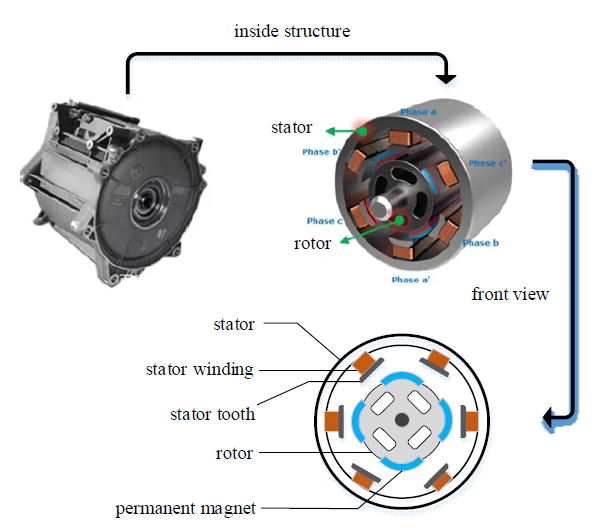


Below is a simple description of the data from the sensors mentioned above:

* " **u_q** ": q component of Voltage measured in Volts
* " **u_d** ": d component of Voltage measured in Volts
* " **i_q** ": q component of Current measured in Amps
* " **i_d** ": d component of Current measured in Amps
* " **torque** ": motor torque (in Nm)
* " **ambient** ": ambient temperature around the stator in °C (measured by a thermal sensor fixed close to stator)
* " **coolant** ": motor coolant (water in this case) temperature of the motor in °C (measured by a fixed thermal sensor at coolant outlet)
* " **motor speed** ": Motor speed (in rpm)
* " **stator_tooth** ": stator tooth temperature in °C
* " **stator_winding** ": stator winding temperature in °C
* " **stator_yoke** ": stator yoke temperature in °C
* " **pm** ": permanent magnet tooth temperature in °C
* " **profile_id** ": id of the measurement session

All the data point are recorded in 2Hz (one row per 0.5 seconds)

<a id="imports"></a>
## 1. Import

In [433]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [434]:
data_df = pd.read_csv("measures_v2.csv")

In [3]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1330816 entries, 0 to 1330815
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   u_q             1330816 non-null  float64
 1   coolant         1330816 non-null  float64
 2   stator_winding  1330816 non-null  float64
 3   u_d             1330816 non-null  float64
 4   stator_tooth    1330816 non-null  float64
 5   motor_speed     1330816 non-null  float64
 6   i_d             1330816 non-null  float64
 7   i_q             1330816 non-null  float64
 8   pm              1330816 non-null  float64
 9   stator_yoke     1330816 non-null  float64
 10  ambient         1330816 non-null  float64
 11  torque          1330816 non-null  float64
 12  profile_id      1330816 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 132.0 MB


In [4]:
data_df.isnull().sum()

u_q               0
coolant           0
stator_winding    0
u_d               0
stator_tooth      0
motor_speed       0
i_d               0
i_q               0
pm                0
stator_yoke       0
ambient           0
torque            0
profile_id        0
dtype: int64

In [5]:
data_df.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01


---

<a id="EDA"></a>
## 2. EDA

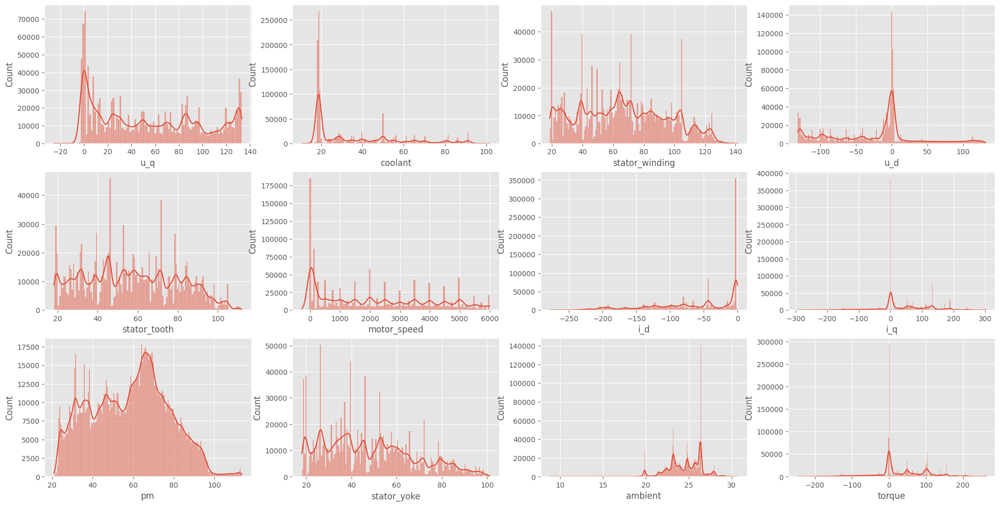

In [435]:
plt.figure(figsize=(24, 12))
for i in range(len(data_df.columns)-1):
    plt.subplot(3, 4, i + 1)
    sns.histplot(data_df[data_df.columns[i]], kde=True)  
plt.show()

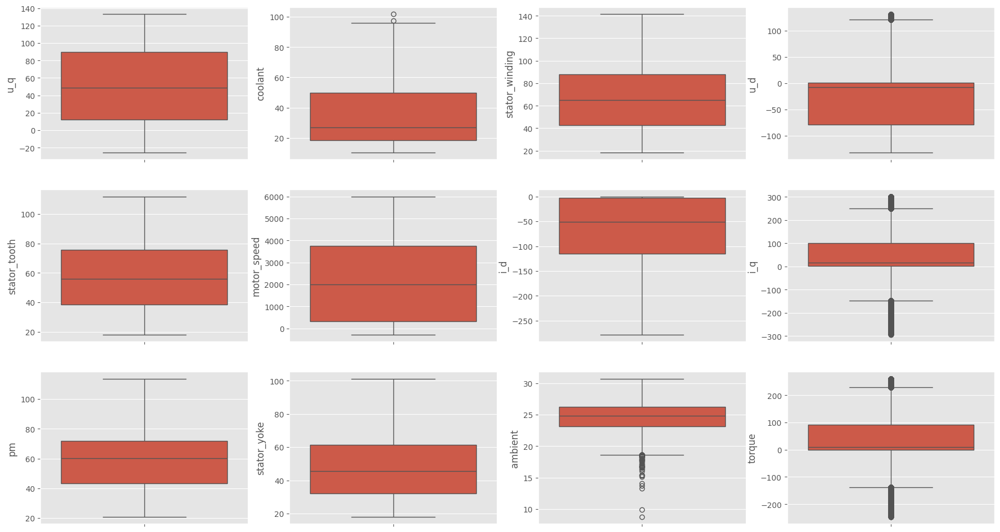

In [436]:
plt.figure(figsize=(22, 12))
for i in range(len(data_df.columns)-1):
    plt.subplot(3, 4, i + 1)
    sns.boxplot(data_df[data_df.columns[i]])
plt.show()

<Figure size 2000x2000 with 0 Axes>

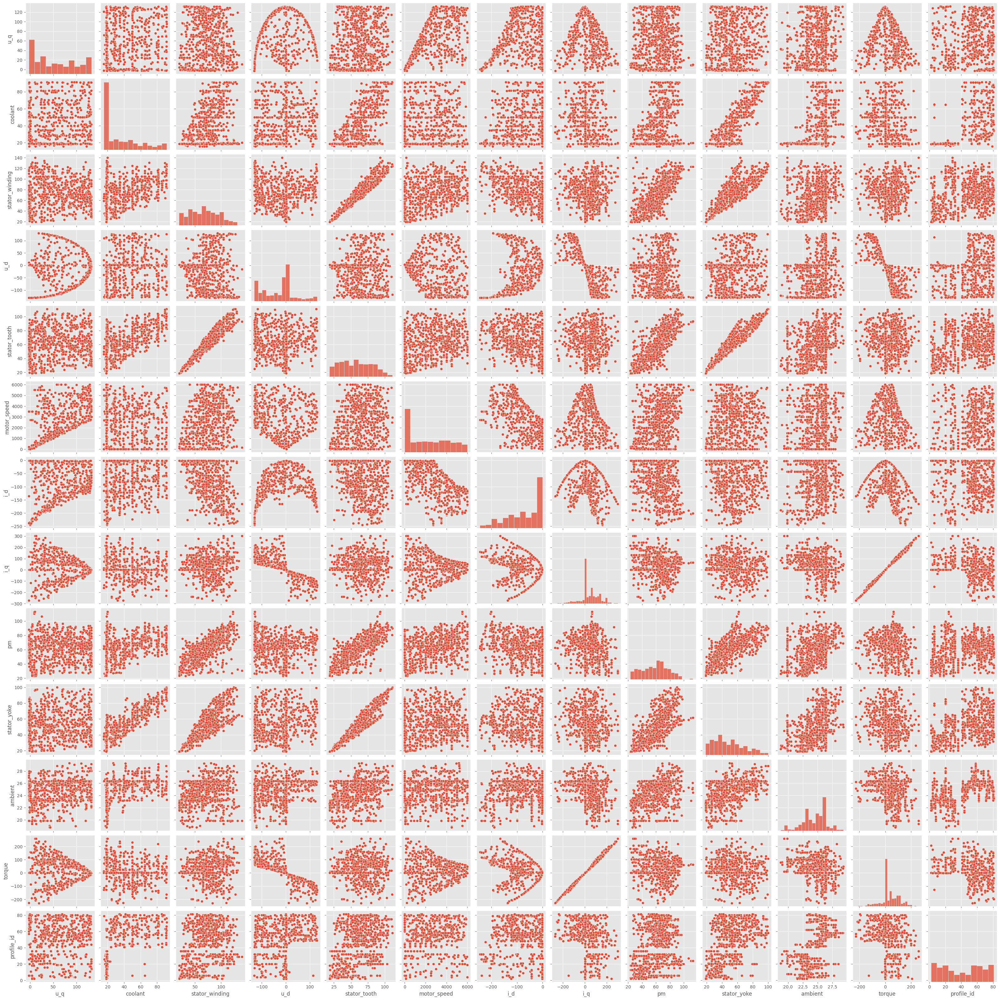

In [437]:
plt.figure(figsize=(20, 20))
sns.pairplot(data_df.sample(1000))
plt.show()

### 2.1 General trends of our data features

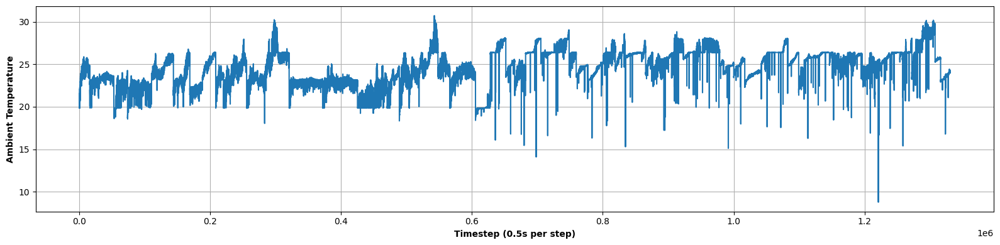

In [9]:
data_df.loc[:, 'ambient'].plot(figsize=(16,4))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Ambient Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

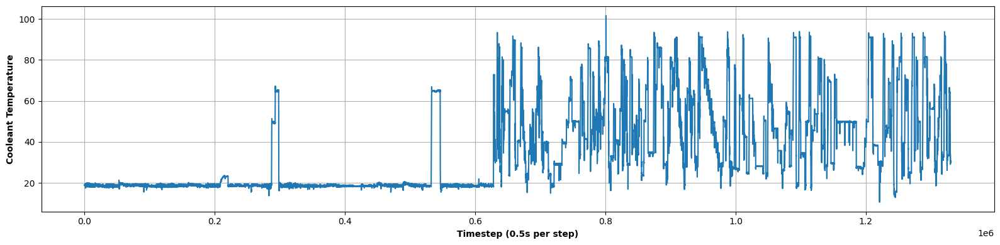

In [10]:
data_df.loc[:, 'coolant'].plot(figsize=(16,4))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Cooleant Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

Our training data appears to be ordered and not shuffled, as can be seen from the relatively continuous series represented above for the two selected variables.

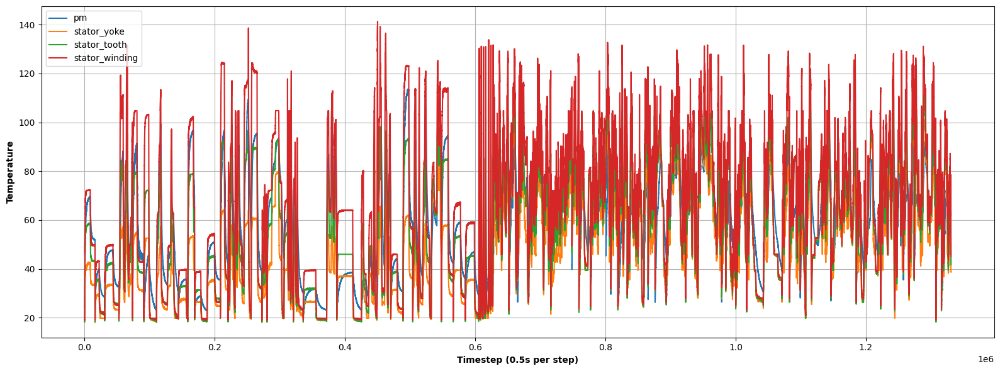

In [11]:
output_vars = ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']
data_df[output_vars].plot(figsize=(16,6))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

When we plot through the whole dataset we find mostly noise

In [12]:
data_df['profile_id'].value_counts()[:5]

profile_id
20    43971
6     40388
65    40094
18    37732
66    36476
Name: count, dtype: int64

### 2.2 Exploring trends within an example Profile ID

**Briefly exploring the data associated with an example profile ID**

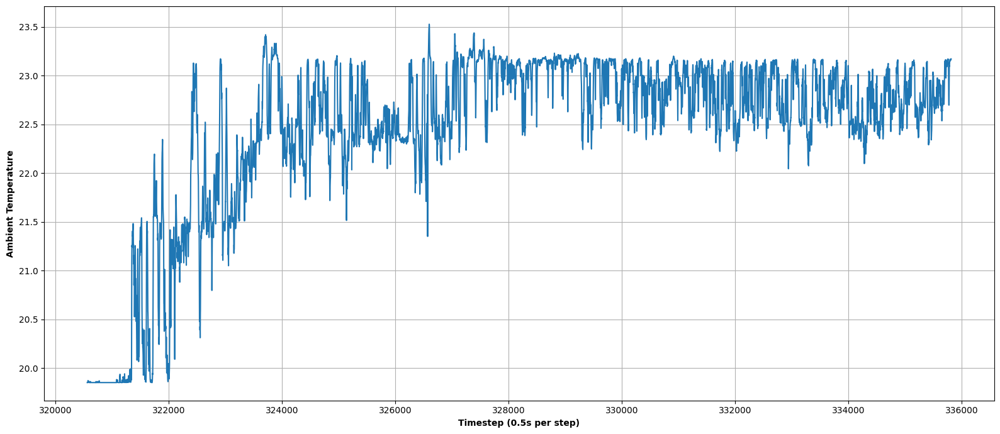

In [13]:
EXAMPLE_ID = 10

example_profile = data_df.loc[data_df['profile_id'] == EXAMPLE_ID].copy()
example_profile['ambient'].plot(figsize=(16,7))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Ambient Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

This data is extremely noisy in its current form. Fix:

In [14]:
# range of spans to experiment with
spans = [600, 1200, 2400, 4800]

for span in spans:
    new_col = f"ambient_exp_{span}"
    example_exp_ma = example_profile.ewm(span=span, adjust=False).mean()
    example_profile[new_col] = example_exp_ma['ambient'].copy()
    
ambient_cols = [x for x in example_profile.columns.values if x.startswith('ambient')]

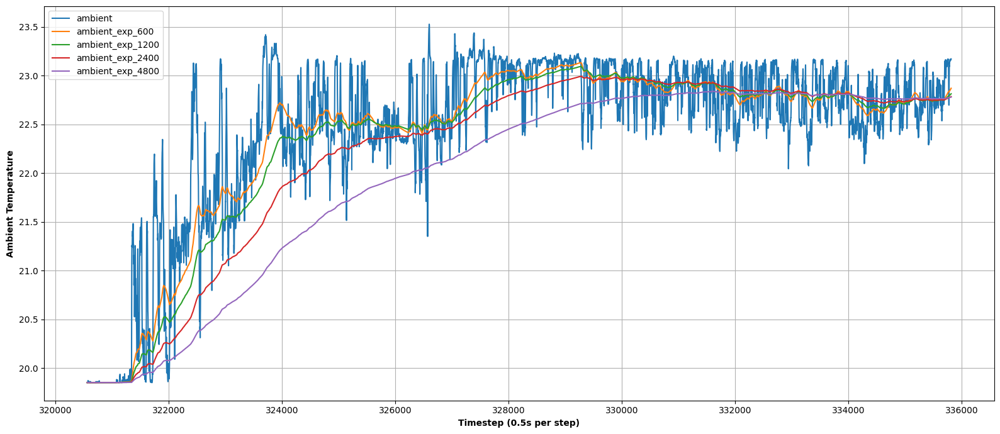

In [15]:
example_profile[ambient_cols].plot(figsize=(16,7))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Ambient Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

By applying exponential weighted moving average functions as shown above, we can effectively reduce the noise within our dataset.

In [16]:
# range of spans to experiment with
spans = [600, 1200, 2400]

chosen_col = 'coolant'

for span in spans:
    new_col = f"{chosen_col}_exp_{span}"
    example_exp_ma = example_profile.ewm(span=span, adjust=False).mean()
    example_profile[new_col] = example_exp_ma[chosen_col].copy()
    
chosen_cols = [x for x in example_profile.columns.values if x.startswith(chosen_col)]

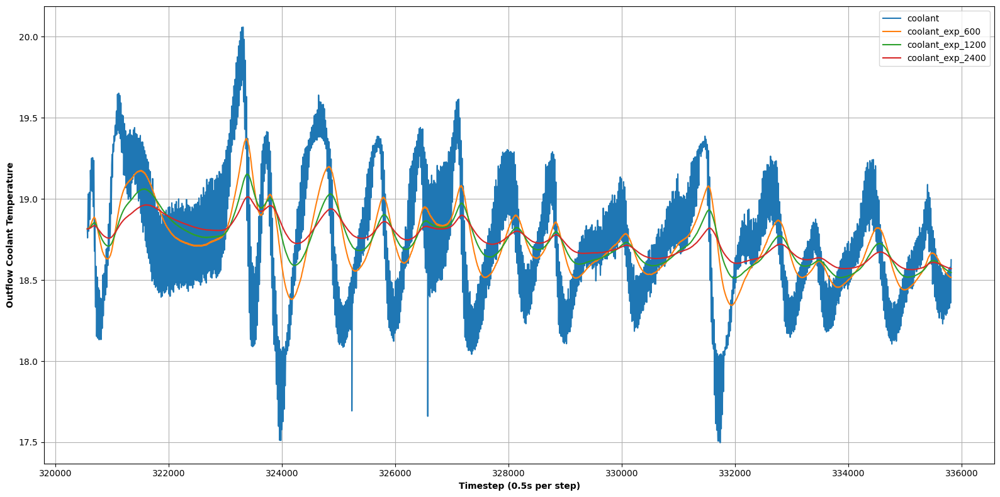

In [17]:
example_profile[chosen_cols].plot(figsize=(16,8))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Outflow Coolant Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

From the basic measured parameters, we want to be able to predict the temperatures at the rotor, stator yoke, stator tooth, and stator winding as part of the efforts in increasing Electric Vehicle (EV) efficiencies. It's not practical to be able to measure these in real time for commercialised vehicles, so being able to accurately predict these temperatures would be extremely valueble.

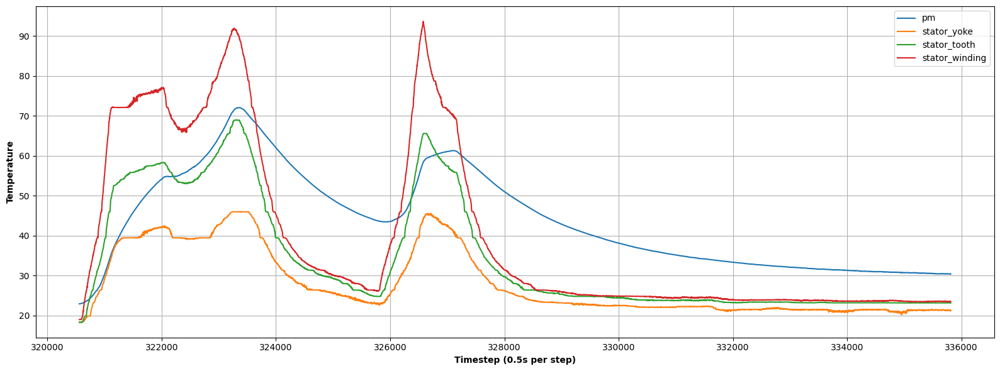

In [18]:
output_vars = ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']

example_profile[output_vars].plot(figsize=(16,6))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Temperature", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()


A good thing is that for the example we've looked at, each of the four output dependent variables appear to be highly correlated

Let's see how these output variables look after applying applying an exponentially weighted average to each variable:

In [19]:
exp_ma = example_profile[output_vars].ewm(span=500).mean()

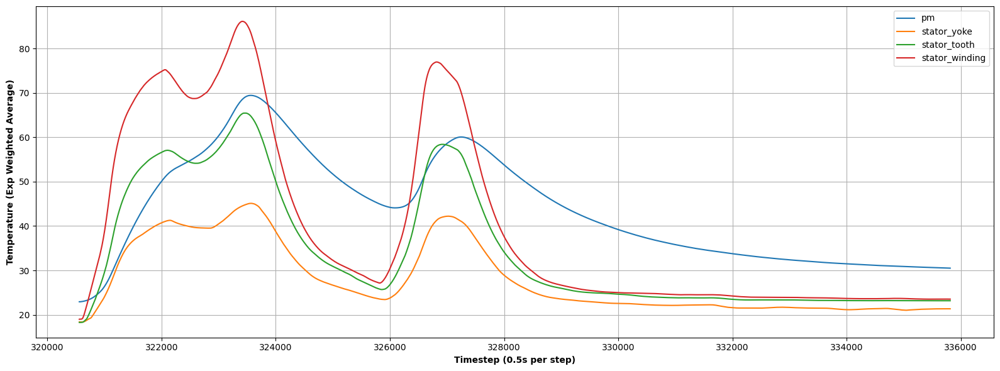

In [20]:
exp_ma.plot(figsize=(16,6))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Temperature (Exp Weighted Average)", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

Now let's assess the input features over time:

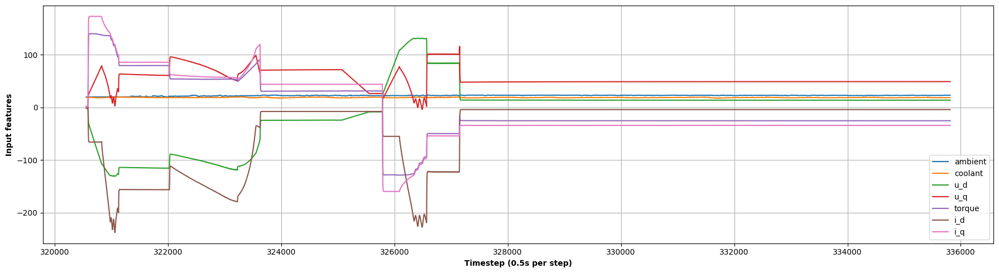

In [21]:
input_cols = ['ambient', 'coolant', 'u_d', 'u_q', 'torque', 'i_d', 'i_q']

example_profile[input_cols].plot(figsize=(18,5))
plt.xlabel("Timestep (0.5s per step)", weight="bold")
plt.ylabel("Input features", weight="bold")
plt.tight_layout()
plt.grid()
plt.show()

### 2.3 Correlation of our features

In [22]:
train_df_correlations = data_df.corr()

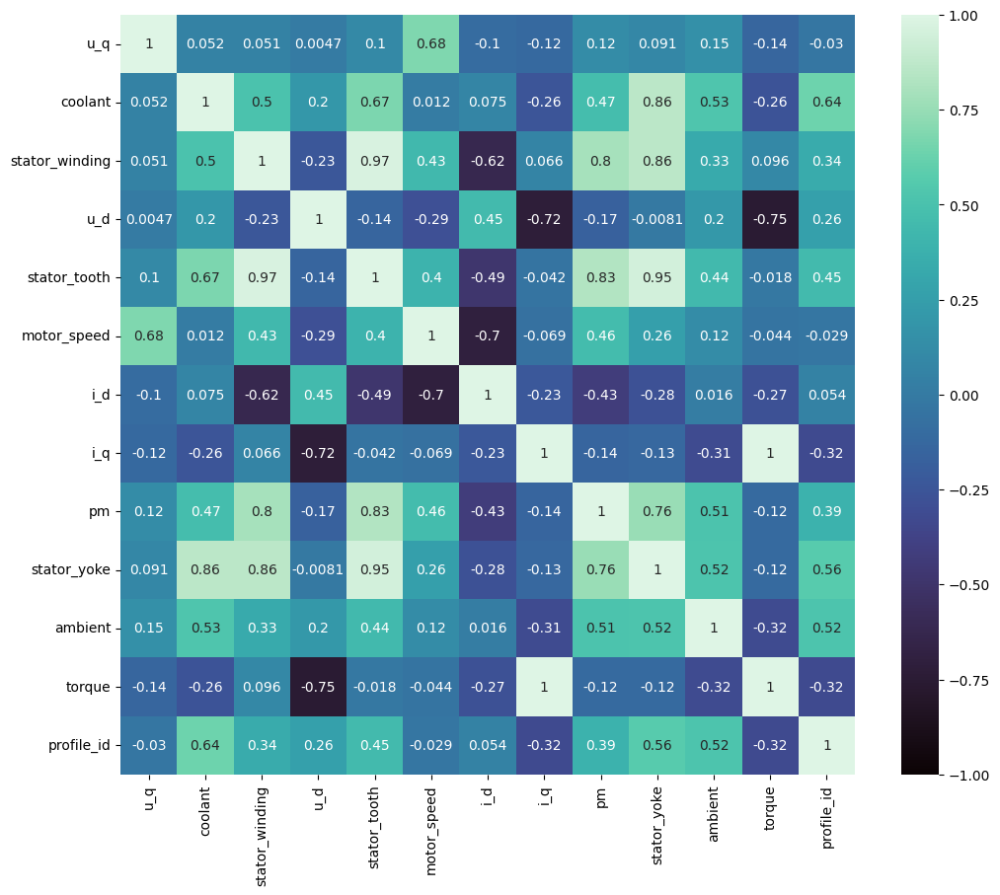

In [23]:
plt.figure(figsize=(12,10))
sns.heatmap(train_df_correlations, annot=True, vmin=-1.0, cmap='mako')
plt.show()

In [24]:
training_sample = data_df.sample(100000)

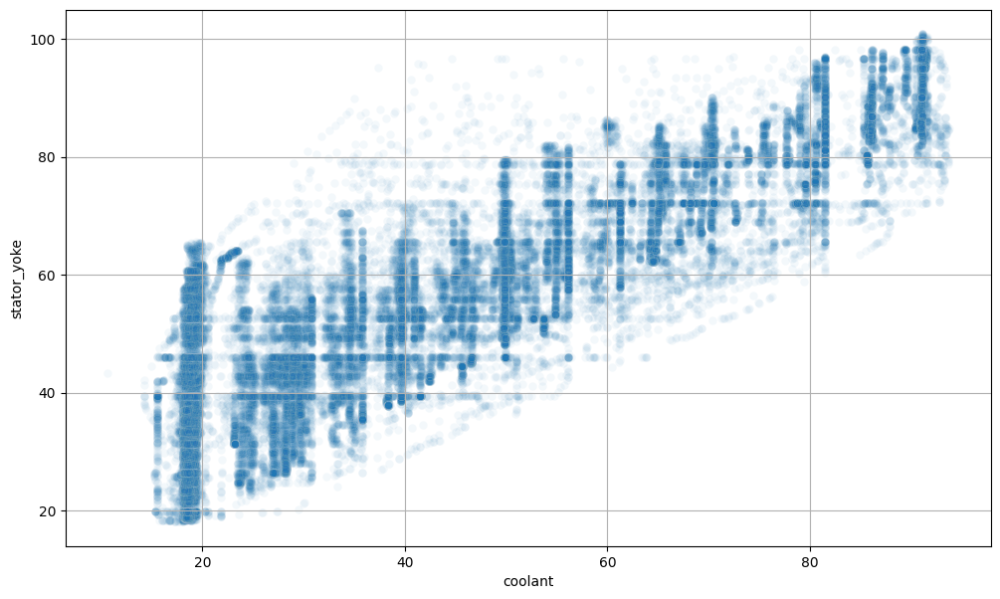

In [25]:
plt.figure(figsize=(12,7))
sns.scatterplot(x='coolant', y='stator_yoke', data=training_sample, alpha=0.05)
plt.grid()
plt.show()

We have a nice correlation between coolant and one of the dependent outputs - stator yoke.

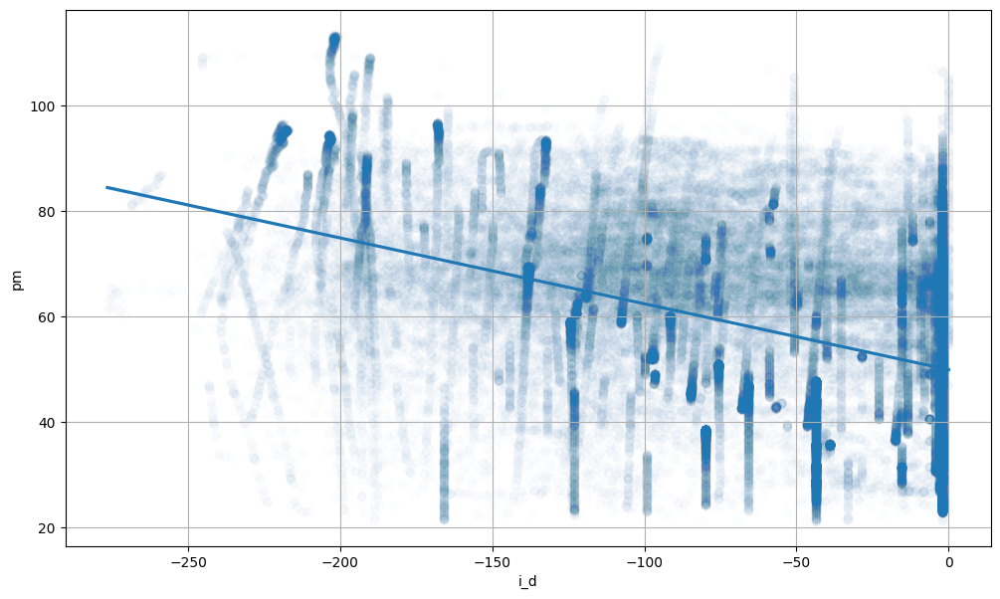

In [26]:
plt.figure(figsize=(12,7))
ax = sns.regplot(x="i_d", y="pm", data=training_sample, scatter_kws={'alpha':0.01})
plt.grid()
plt.show()

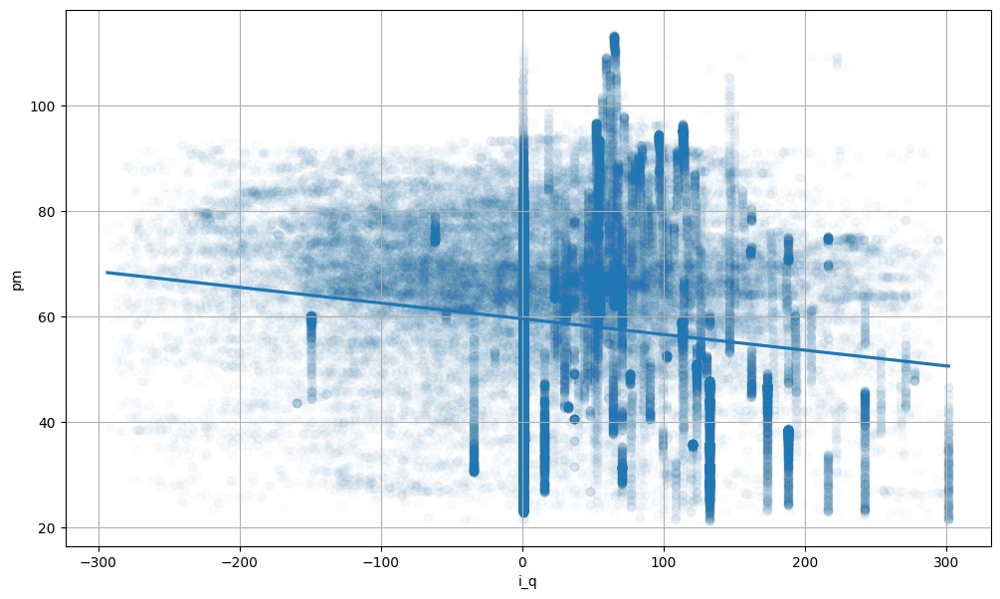

In [27]:
plt.figure(figsize=(12,7))
ax = sns.regplot(x="i_q", y="pm", data=training_sample, scatter_kws={'alpha':0.02})
plt.grid()
plt.show()

**Lets look at how the output variables are correlated to one-another:**

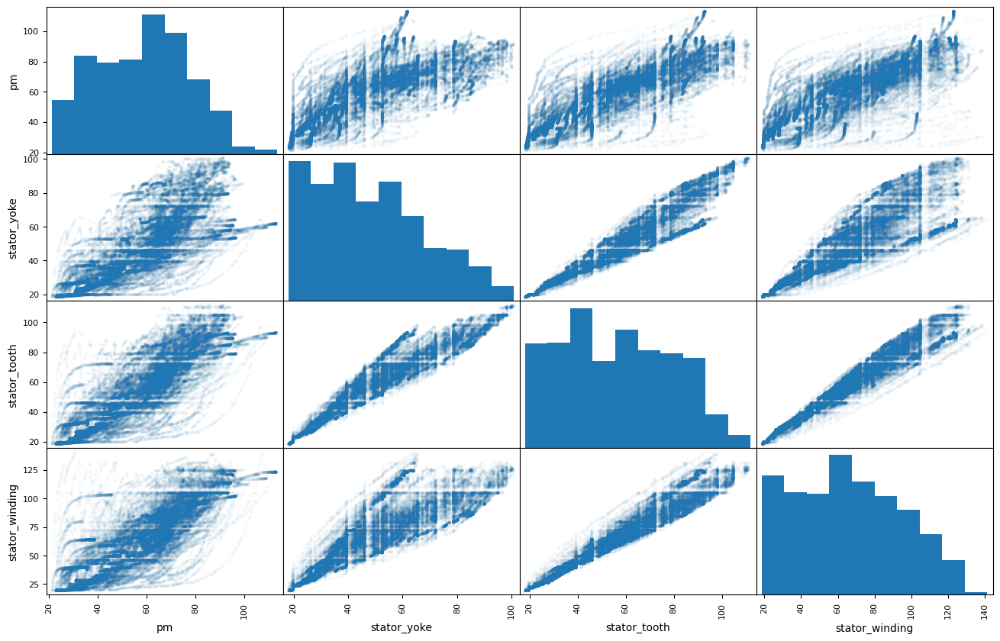

In [28]:
pd.plotting.scatter_matrix(training_sample[output_vars], figsize=(16, 10), alpha=0.02)
plt.show()

All of our output variables are highly correlated to one another, which makes sense; as the temperature of a given component tends to increase in the motor, so do all of the others on average.

---

<a id="training-splits"></a>
## 3. Creation of our training and test splits 

Text(0.5, 0, 'Time (hr)')

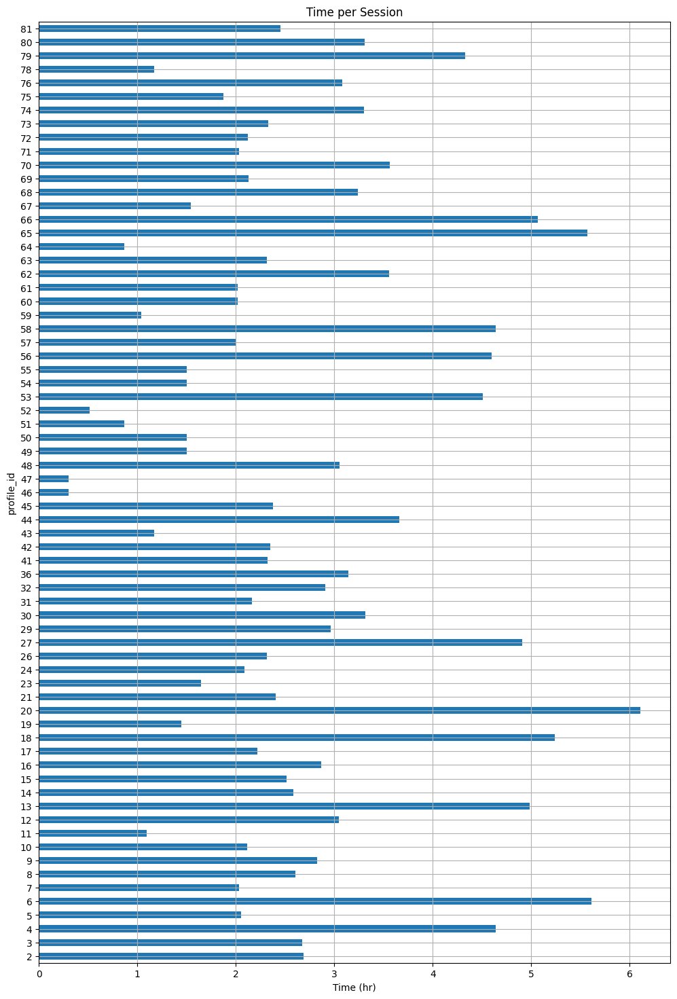

In [29]:
sessions = data_df.groupby('profile_id').agg('count')['u_d'] / (2 * 3600)
sessions.plot.barh(figsize=(12,18), grid='both', title='Time per Session')
plt.xlabel('Time (hr)')

Text(0.5, 0, 'Time (hr)')

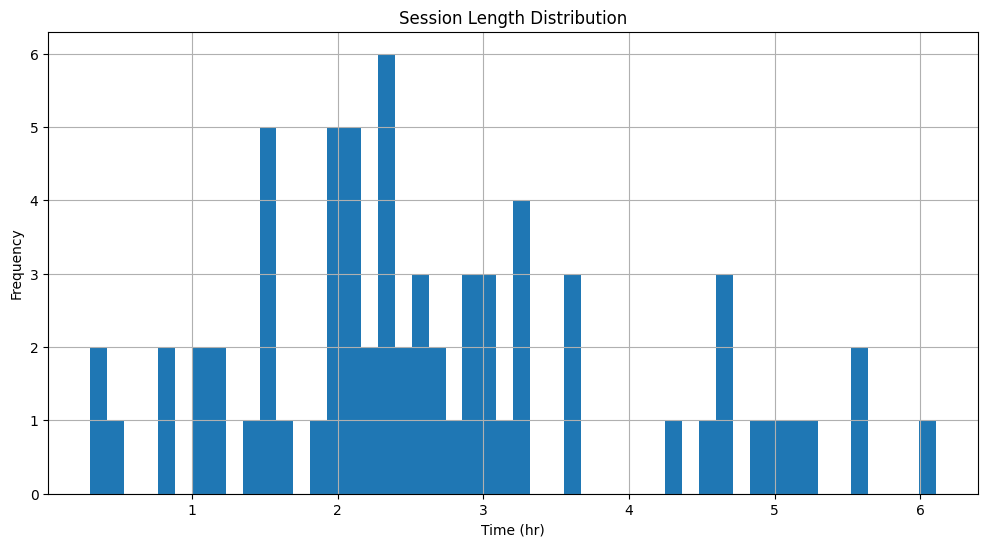

In [30]:
sessions.plot.hist(bins=50, title='Session Length Distribution', figsize=(12,6), grid='both')
plt.xlabel('Time (hr)')

We want to allocate a proportion of the total data as our test set. We'll do this using the profile IDs, since we want to fairly test the generalisation performance of our models. If we leak information from various profile ids in the test set into the training set, our models will be assessed as over-optimistically good in terms of performance.

In [31]:
full_profiles = data_df['profile_id'].value_counts().index.values
test_set_profiles = [31, 32, 41, 42, 51, 52, 61, 62, 71, 73]
train_set_profiles = [id for id in full_profiles if id not in test_set_profiles]

In [32]:
train_df = data_df.loc[data_df['profile_id'].isin(train_set_profiles)].copy()
test_df = data_df.loc[data_df['profile_id'].isin(test_set_profiles)].copy()

len(train_df['profile_id'].value_counts()), len(test_df['profile_id'].value_counts())

(59, 10)

In [33]:
train_df.shape, test_df.shape 

((1179104, 13), (151712, 13))

In [34]:
train_df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [35]:
test_df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
52694,0.101997,21.393656,19.525938,2.011207,18.589853,0.005562,-1.423747,0.781086,21.222401,19.051897,18.972059,0.417595,32
52695,0.161591,21.337299,19.528730,2.247789,18.590281,0.007106,-1.588072,0.869595,21.229551,19.036428,18.979858,0.548192,32
52696,0.182339,21.295460,19.536510,2.405840,18.593746,0.001353,-1.703102,0.936638,21.232189,19.007898,18.974022,0.625411,32
52697,0.132575,21.271318,19.533518,2.459967,18.593220,-0.002535,-1.788639,0.980437,21.229914,19.005539,18.967342,0.639899,32
52698,-0.001458,21.230772,19.532772,2.454361,18.594313,-0.004277,-1.847198,1.015442,21.224682,19.011538,18.986603,0.606860,32


In [36]:
test_profiles = test_df.loc[:, 'profile_id'].copy()
test_labels = test_df.loc[:, ['pm']].copy()
test_df.drop(['profile_id', 'pm'], axis=1, inplace=True)

In [37]:
test_df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,stator_yoke,ambient,torque
52694,0.101997,21.393656,19.525938,2.011207,18.589853,0.005562,-1.423747,0.781086,19.051897,18.972059,0.417595
52695,0.161591,21.337299,19.528730,2.247789,18.590281,0.007106,-1.588072,0.869595,19.036428,18.979858,0.548192
52696,0.182339,21.295460,19.536510,2.405840,18.593746,0.001353,-1.703102,0.936638,19.007898,18.974022,0.625411
52697,0.132575,21.271318,19.533518,2.459967,18.593220,-0.002535,-1.788639,0.980437,19.005539,18.967342,0.639899
52698,-0.001458,21.230772,19.532772,2.454361,18.594313,-0.004277,-1.847198,1.015442,19.011538,18.986603,0.606860


In [38]:
# add names to the index of each df
train_df.index.name = 'timestep'
test_df.index.name = 'timestep'

---

In [39]:
df_test = data_df[(data_df['profile_id'] == 65) | (data_df['profile_id'] == 72)]
df = data_df[(data_df['profile_id'] != 65) & (data_df['profile_id'] != 72)]

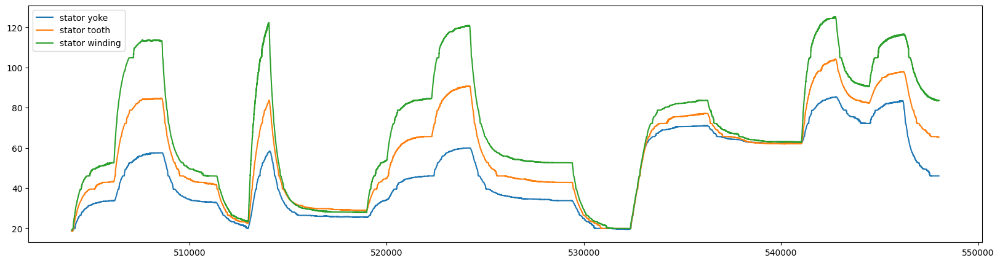

In [40]:
plt.figure(figsize=(20,5))
df[df['profile_id'] == 20]['stator_yoke'].plot(label = 'stator yoke')
df[df['profile_id'] == 20]['stator_tooth'].plot(label = 'stator tooth')
df[df['profile_id'] == 20]['stator_winding'].plot(label = 'stator winding')
plt.legend()

## 4. Linear Regression Model

In [ ]:
import sklearn
from math import sqrt
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.model_selection import KFold

In [ ]:
# extracting independent variable
X = df.iloc[:,:-1].values
# extracting dependent variable
Y = df.iloc[:,-1].values 
print(X.shape)
print(Y.shape)

(1275421, 11)
(1275421,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.3, random_state = 100)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(892794, 11) (892794,)
(382627, 11) (382627,)


In [ ]:
l_reg = LinearRegression()
l_reg.fit(X_train,Y_train)

l_train_acc = (l_reg.score(X_train,Y_train))*100
l_test_acc = (l_reg.score(X_test,Y_test))*100

print(f"Train accuracy: {l_train_acc}")
# printf("Train accuracy is %f", l_train_acc)
print(f"Test accuracy: {l_test_acc}")

Train accuracy: 85.59150023553586
Test accuracy: 85.54062554647304


In [ ]:
Y_pred = l_reg.predict(X_test)
print(Y_test.shape, Y_pred.shape)

(382627,) (382627,)


In [ ]:
r2_l = r2_score(Y_test, Y_pred)*100
rms_l = sqrt(mean_squared_error(Y_test, Y_pred))
mae_l = mean_absolute_error(Y_test, Y_pred)
print(f"R^2 score of model is {r2_l} %")
print(f"Root mean squared error is {rms_l}")
print(f"Mean absolute error is {mae_l}")

R^2 score of model is 85.54062554647304 %
Root mean squared error is 7.281604368221251
Mean absolute error is 5.433462573466555


### Performing KFold Cross-Validation (CV) 

In [ ]:
# prepare the cross-validation procedure
cv = KFold(n_splits=10, random_state=100, shuffle=True)
# create model
l_reg = LinearRegression()
l_reg.fit(X_train, Y_train)
# evaluate model
scores = cross_val_score(l_reg, X_train, Y_train, scoring='r2', cv=cv)
print(f'Score Array list: {scores}') 
print('\n')
# report performance
Y_pred_cv_l = l_reg.predict(X_test)
r2_l_cv = sklearn.metrics.r2_score(Y_test, Y_pred_cv_l)*100
print(f'R^2 Score: {r2_l_cv} %')

Score Array list: [0.85492408 0.85789897 0.85577037 0.85725542 0.85436268 0.85556262
 0.85437736 0.85702206 0.85674801 0.85514006]


R^2 Score: 85.54062554647304 %


### Evaluation Table 

In [ ]:
calculation = pd.DataFrame(np.c_[Y_test,l_reg.predict(X_test)], columns = ["Original Temperature","Predicted Temperature"])
calculation.head(5)

,Original Temperature,Predicted Temperature
0,80.370648,77.170195
1,81.354715,77.506720
2,75.681844,76.630113
3,36.301079,40.731363
4,46.072262,47.081153


### Visualizing the test results 

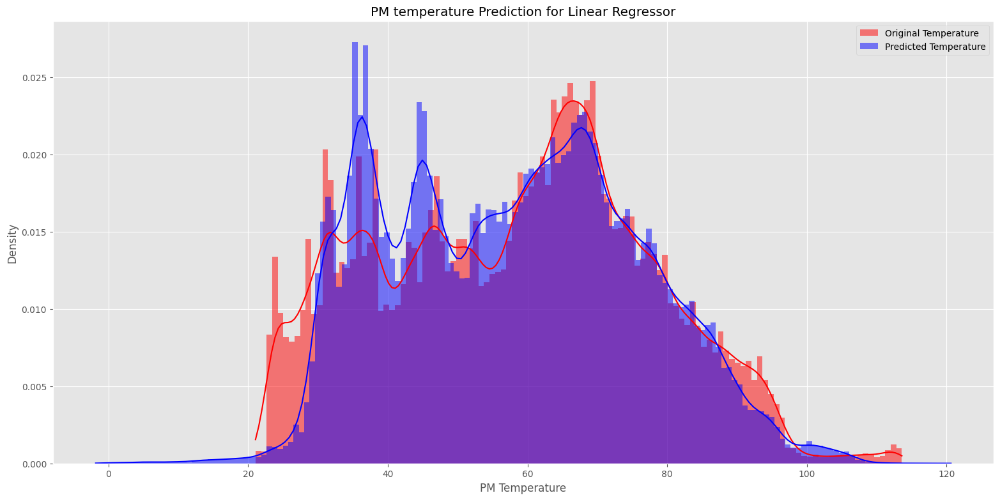

In [ ]:
plt.style.use('ggplot') 
plt.figure(figsize=(19,9))
sns.histplot(Y_test, color="red", kde=True, stat="density", linewidth=0, label = 'Original Temperature')
sns.histplot(Y_pred, color="blue", kde=True, stat="density", linewidth=0, label = 'Predicted Temperature')
plt.legend(loc = 'upper right') 
plt.title("PM temperature Prediction for Linear Regressor") 
plt.xlabel("PM Temperature")
plt.ylabel("Density")
plt.show()

## 5. MLPRegressor and filtering data

In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor


In [ ]:
data_raw = pd.read_csv('measures_v2.csv')
data_copy = data_raw.copy(deep=True)

In [ ]:
profile_list = np.array([i for i in data_raw['profile_id'].unique() if i < 65])

In [ ]:
target_variables = ['pm', 'stator_yoke', 'stator_winding', 'stator_tooth']
drop_cols = ['profile_id']

In [ ]:
cols = [item for item in list(data_copy.columns) if item not in drop_cols + target_variables]

In [ ]:
scaler = MinMaxScaler()
data_copy[cols] = scaler.fit_transform(data_copy[cols])

In [ ]:
data_train = data_copy[data_copy['profile_id'].isin(profile_list)]

data_test = data_copy[data_copy['profile_id'] == 65]

In [ ]:
reg = MLPRegressor(hidden_layer_sizes=(49), max_iter=200, activation='tanh', verbose=False, random_state=1)

In [ ]:
X_train = data_train.drop(columns = target_variables + drop_cols)
Y_train = data_train[target_variables]

In [ ]:
reg.fit(X_train, Y_train)

c:\Users\Aleksa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(activation='tanh', hidden_layer_sizes=49, random_state=1)

In [ ]:
X_test = data_test.drop(columns = target_variables + drop_cols)
Y_test_actual = data_test[target_variables]

In [ ]:
Y_test_prediction = reg.predict(X_test)  

In [ ]:
prediction_df = pd.DataFrame(Y_test_prediction)

In [ ]:
prediction_df = prediction_df.rename(columns={0: 'pm_pred', 1: 'stator_yoke_pred', 2: 'stator_winding_pred', 3: 'stator_tooth_pred'})

In [ ]:
prediction_df = Y_test_actual.reset_index().merge(prediction_df, left_index = True, right_index=True).set_index('index')

actual


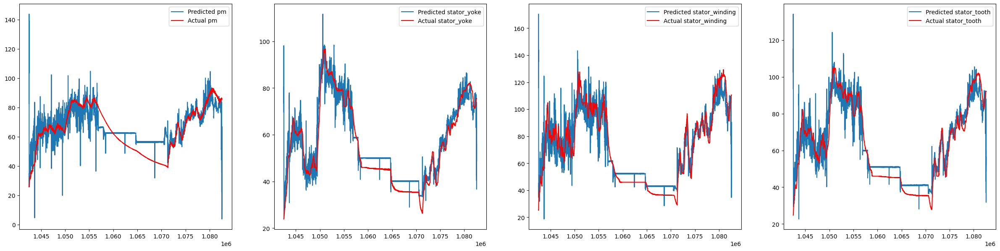

In [ ]:

plt.figure(figsize=(30, 7))
print('actual')

for idx, col in enumerate(target_variables): 
    plt.subplot(1, 4, idx+1)
    plt.plot(prediction_df[col + '_pred'], label='Predicted ' + col)
    plt.plot(prediction_df[col], color='red', label='Actual ' + col)
    plt.legend(loc="upper right")

plt.show()


In [ ]:
predicted_cols = [col + '_pred' for col in target_variables] 
smoothed_cols = [col + '_smoothed' for col in predicted_cols] 

In [ ]:
from scipy.signal import savgol_filter
for column in predicted_cols:
    prediction_df[column+'_smoothed'] = savgol_filter(prediction_df[column], 501, 1)

actual


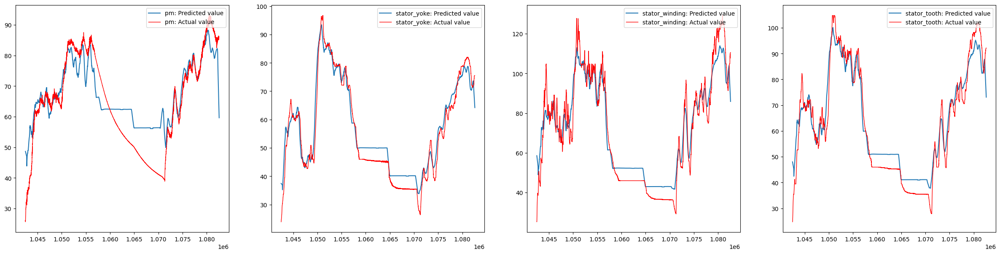

In [ ]:
plt.figure(figsize=(30, 7))
print('actual')

for idx,col in enumerate(target_variables): 
    plt.subplot(1, 4, idx+1)
    plt.plot(prediction_df[col + '_pred_smoothed'], label=col+': Predicted value')
    plt.plot(prediction_df[col], color='red', lw=1 , label=col+': Actual value')
    plt.legend(loc="upper right")
plt.show()

In [ ]:
for column in target_variables:
    print('column: ', column)
    print('no smooth: ', mean_squared_error(Y_test_actual[column], prediction_df[column+'_pred'].to_numpy()))
    print('smooth: ', mean_squared_error(Y_test_actual[column], prediction_df[column+'_pred_smoothed'].to_numpy()), '\r\n')
    

column:  pm
no smooth:  77.3477476442558
smooth:  59.09789033481415 

column:  stator_yoke
no smooth:  25.07595194496103
smooth:  17.00383943395202 

column:  stator_winding
no smooth:  96.48607814982257
smooth:  58.60543469725239 

column:  stator_tooth
no smooth:  49.03839459313781
smooth:  32.07510201649092 



## 6. LSTM and many configs

In [420]:
import torch 
import torch.nn as nn
from sklearn.preprocessing import StandardScaler

In [421]:
column_names = data_df.columns

# Izuzmite kolonu 'profile_id'
data_df_no_profile = data_df.drop(columns=['profile_id'])

# Standardizujte preostale kolone
scaler = StandardScaler()
x_scaled = scaler.fit_transform(data_df_no_profile)

# Kreirajte novi DataFrame sa standardizovanim podacima i originalnim imenima kolona
data_df_standardized = pd.DataFrame(x_scaled, columns=column_names[:-1])

# Dodajte ponovo kolonu 'profile_id'
data_df_standardized['profile_id'] = data_df['profile_id']

In [422]:
data_df_standardized

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-1.238979,-0.799812,-1.648158,0.392820,-1.681117,-1.184128,1.058337,-0.405855,-1.786837,-1.494244,-2.443386,-0.400838,17
1,-1.236150,-0.799197,-1.647959,0.393521,-1.681047,-1.184129,1.058278,-0.405867,-1.787686,-1.494323,-2.443396,-0.400082,17
2,-1.238757,-0.798729,-1.648064,0.392464,-1.681078,-1.184128,1.058289,-0.405854,-1.787338,-1.493755,-2.443404,-0.400974,17
3,-1.236180,-0.798417,-1.648285,0.393356,-1.681146,-1.184126,1.058270,-0.405836,-1.786847,-1.493529,-2.443409,-0.400174,17
4,-1.239442,-0.797432,-1.648303,0.393101,-1.681195,-1.184127,1.057279,-0.405455,-1.786248,-1.493738,-2.443413,-0.400565,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330811,-1.277497,-0.252853,-0.734801,0.410918,-0.651102,-1.184129,1.027466,-0.393952,0.191617,-0.476927,-0.298612,-0.403264,71
1330812,-1.279909,-0.252853,-0.736038,0.410713,-0.653952,-1.184128,1.027461,-0.393952,0.191347,-0.476796,-0.308136,-0.403264,71
1330813,-1.277003,-0.252853,-0.736995,0.411126,-0.656745,-1.184128,1.027480,-0.393939,0.191122,-0.477067,-0.304750,-0.403264,71
1330814,-1.280131,-0.252852,-0.737626,0.410463,-0.658601,-1.184126,1.027453,-0.393972,0.190861,-0.476829,-0.292215,-0.403264,71


In [423]:
#function to trim sessions to an appropriate size
def preprocess(sessions_id, seq_len, target="pm"):
    sessions = []
    for id in sessions_id:
        s = data_df_standardized[data_df_standardized["profile_id"] == id]
        r = len(s) % seq_len
        l = len(s) - r
        
        session = s.iloc[:l]
        
        y = session[target]
        X = session.drop([target, "profile_id"], axis=1)
        
        X = torch.from_numpy(X.values).float() 
        y = torch.from_numpy(y.values).float()

        sessions.append((X, y))
        
    return sessions

In [424]:
#Bidirectional LSTM class
class NET(nn.Module):
    def __init__(self, in_size, h_size, n_layers, out_size):
        super(NET, self).__init__()
        self.h_size = h_size
        self.n_layers = n_layers
        self.out_size = out_size
        self.lstm = nn.LSTM(in_size, h_size, n_layers, batch_first=True, bidirectional=True)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(h_size * 2, out_size)
             
    def forward(self, x):
        #init. states 
        h0 = torch.zeros(self.n_layers * 2, x.size(0), self.h_size)
        c0 = torch.zeros(self.n_layers * 2, x.size(0), self.h_size)
        
        out, _ = self.lstm(x, (h0, c0)) 
        out = self.fc(out)
        return out 

In [425]:
#defining the sequence length and the sessions ids which are used for training
seq_len = 100
ids = [4, 6, 10, 11, 20, 27, 29, 30, 31,32, 36] + [i+41 for i in range(35)]


#create an lstm instance
model = NET(11, 20, 2, 1)
print(model)

NET(
  (lstm): LSTM(11, 20, num_layers=2, batch_first=True, bidirectional=True)
  (fc): Linear(in_features=40, out_features=1, bias=True)
)


In [426]:
def train_and_evaluate_model(feature, optimizer, criterion, session_81 = False):    
    
    # Trimovanje sesija
    sessions = preprocess(ids, seq_len, feature)

    n_epochs = 15  

    # Lista za čuvanje vrednosti gubitka tokom treniranja
    train_losses = []

    model.train()
    for e in range(n_epochs):
        for X, y in sessions:
            optimizer.zero_grad()
            out = model.forward(X.view(-1, seq_len, 11))
            loss = criterion(out, y.view(-1, seq_len, 1))
            
            loss.backward()
            optimizer.step()
            train_losses.append(loss.detach().numpy())
        
    # Prikaz greške tokom treniranja
    plt.rcParams["figure.figsize"] = [8, 5]
    plt.plot(train_losses, 'b', label='Training Error')
    plt.legend(loc='upper right')
    plt.ylabel('Error')
    plt.title(f'Training Error ({feature}) - Optimizer: {optimizer.__class__.__name__}, Loss: {criterion.__class__.__name__}')  # Dodavanje informacija o optimizatoru i funkciji gubitka
    plt.show()

    model.eval()
    

    # Evaluacija za sesiju 80 i 81
    session_80 = data_df_standardized[data_df_standardized["profile_id"] == 80]
    session_80 = session_80.iloc[:15500]

    y = session_80[feature]
    X = session_80.drop([feature, "profile_id"], axis=1)

    X_80 = torch.from_numpy(X.values[:22000, :]).float() 
    y_80 = torch.from_numpy(y.values[:22000]).float()

    out = model.forward(X_80.view(-1, seq_len, 11))
    loss = criterion(out, y_80.view(-1, seq_len, 1))
    print("Loss: " + str(loss.detach().numpy()))

    out = out[:, -1, :]
    pred = out.detach().numpy().flatten()
    real = y_80.numpy()[seq_len::seq_len]

    plt.plot(real.flatten(), label="real values")
    plt.plot(pred, label="predicted values")
    plt.legend(loc='upper right')
    plt.title(f'Session 80 ({feature}) - Optimizer: {optimizer.__class__.__name__}, Loss: {criterion.__class__.__name__}')  # Dodavanje informacija o optimizatoru i funkciji gubitka
    plt.show()
    
    if session_81:
        # Evaluacija za sesiju 81
        session_81 = data_df_standardized[data_df_standardized["profile_id"] == 81]
        session_81 = session_81.iloc[:15000]

        y = session_81[feature]
        X = session_81.drop([feature, "profile_id"], axis=1)

        X_81 = torch.from_numpy(X.values[:15000, :]).float() 
        y_81 = torch.from_numpy(y.values[:15000]).float()

        out = model.forward(X_81.view(-1, seq_len, 11))
        loss = criterion(out, y_81.view(-1, seq_len, 1))
        print("Loss: " + str(loss.detach().numpy()))

        out = out[:, -1, :]
        pred = out.detach().numpy().flatten()
        real = y_81.numpy()[seq_len::seq_len]

        plt.plot(real.flatten(), label="real values")
        plt.plot(pred, label="predicted values")
        plt.legend(loc='upper right')
        plt.title(f'Session 81 ({feature}) - Optimizer: {optimizer.__class__.__name__}, Loss: {criterion.__class__.__name__}')  # Dodavanje informacija o optimizatoru i funkciji gubitka
        plt.show()




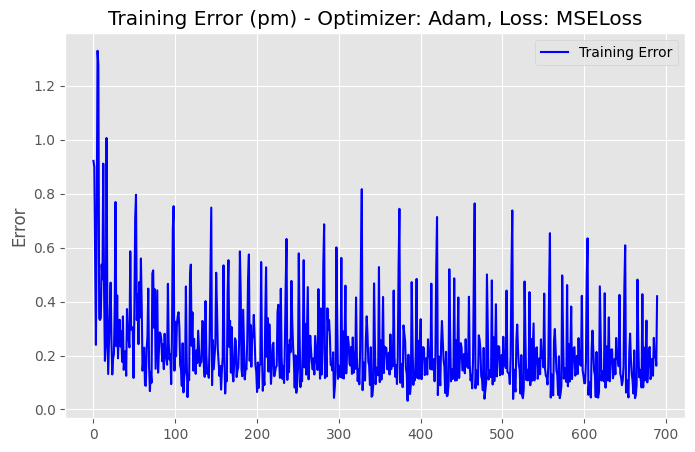

Loss: 0.17037654


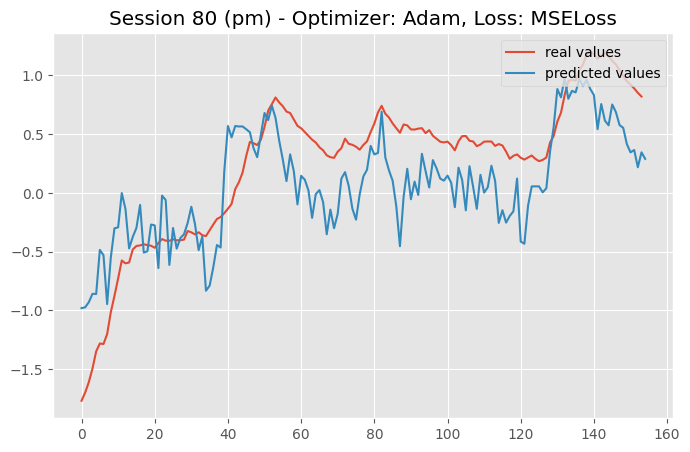

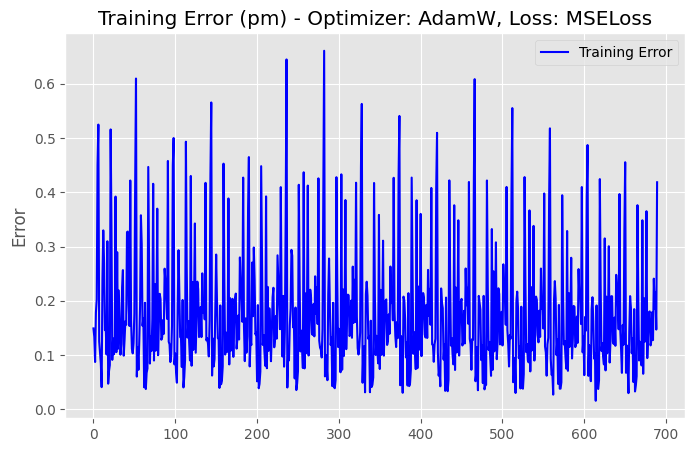

Loss: 0.16987899


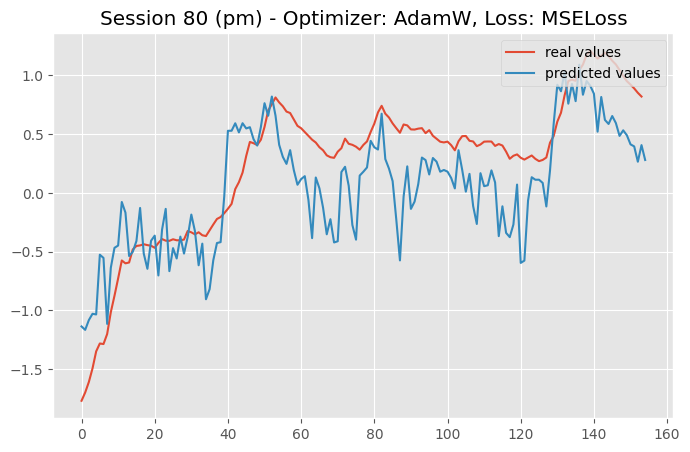

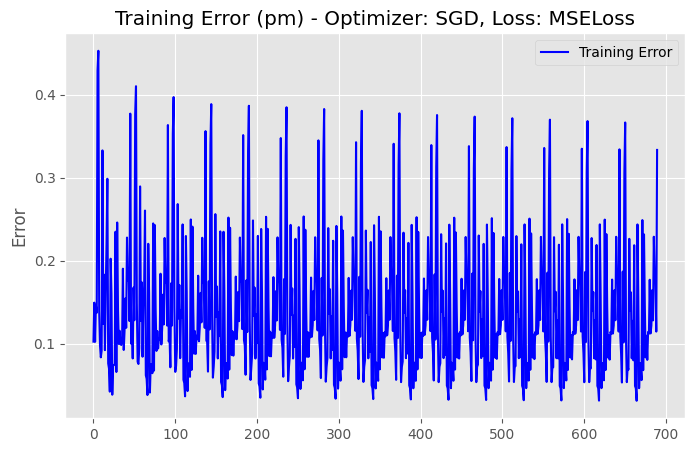

Loss: 0.14007072


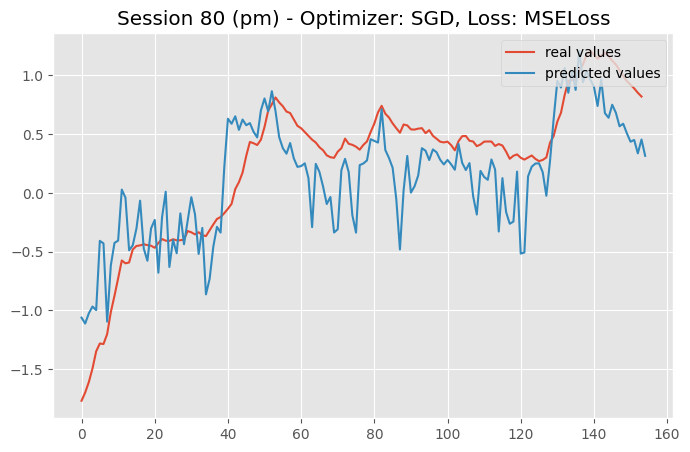

In [427]:
# Primer korišćenja različitih optimizatora
optimizer_adam = torch.optim.Adam(model.parameters(), lr=0.01)
optimizer_adamw = torch.optim.AdamW(model.parameters(), lr=0.01)
optimizer_sgd = torch.optim.SGD(model.parameters(), lr=0.01)

criterion = nn.MSELoss()

train_and_evaluate_model('pm', optimizer_adam, criterion) 
train_and_evaluate_model('pm', optimizer_adamw, criterion)
train_and_evaluate_model('pm', optimizer_sgd, criterion)


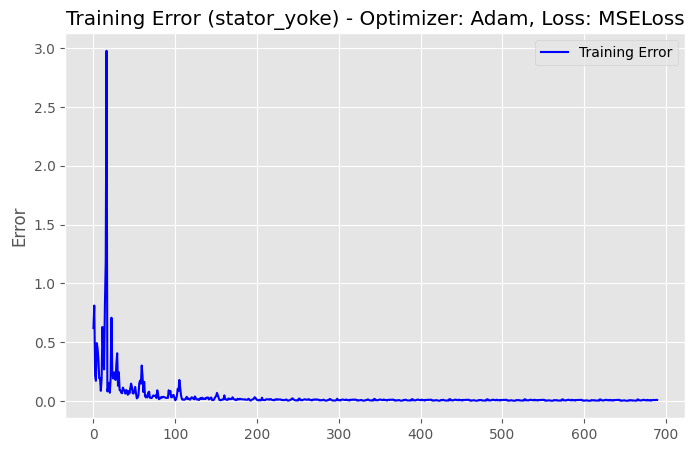

Loss: 0.007341698


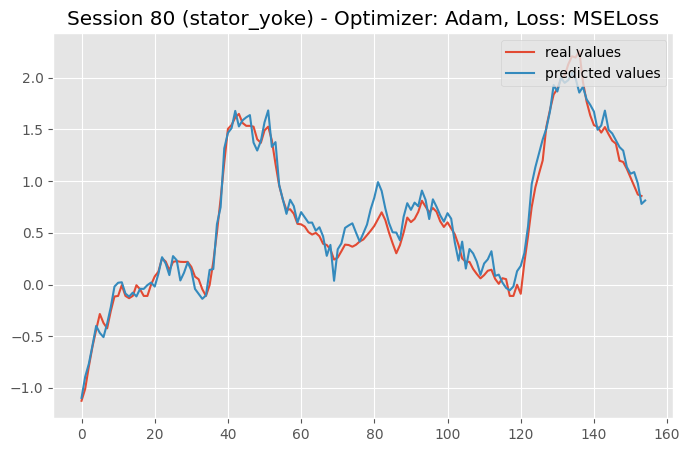

In [428]:
train_and_evaluate_model('stator_yoke', optimizer_adam, criterion) 

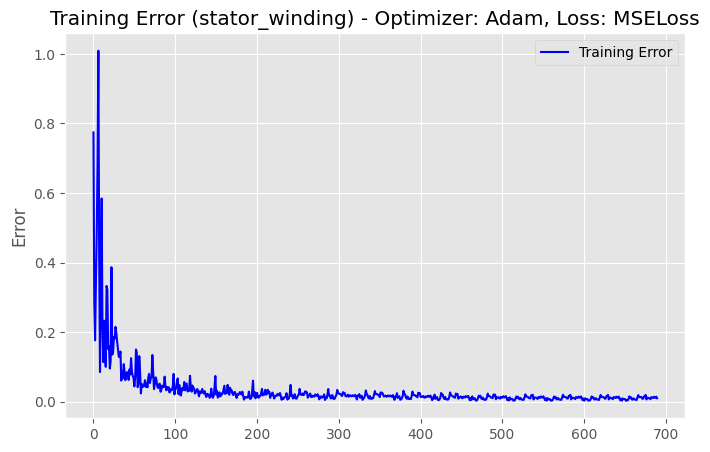

Loss: 0.0127493255


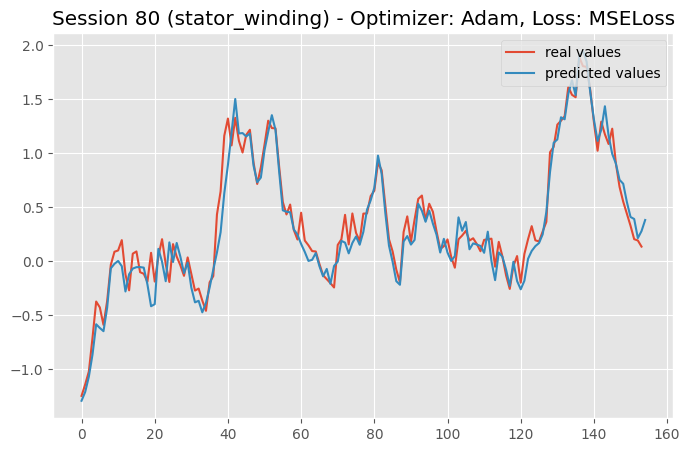

In [429]:
train_and_evaluate_model('stator_winding', optimizer_adam, criterion) 

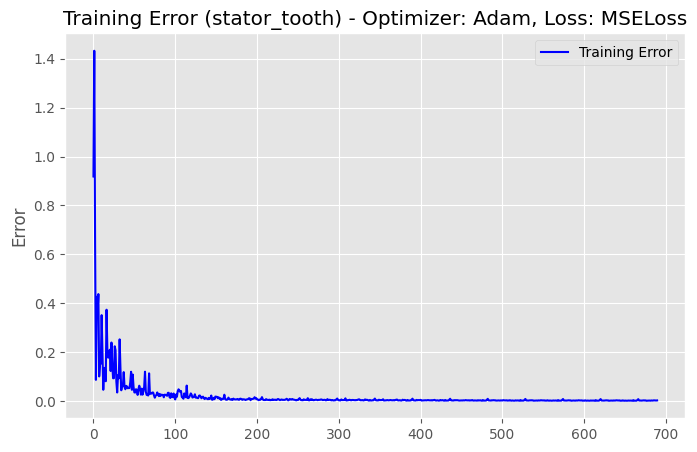

Loss: 0.002465356


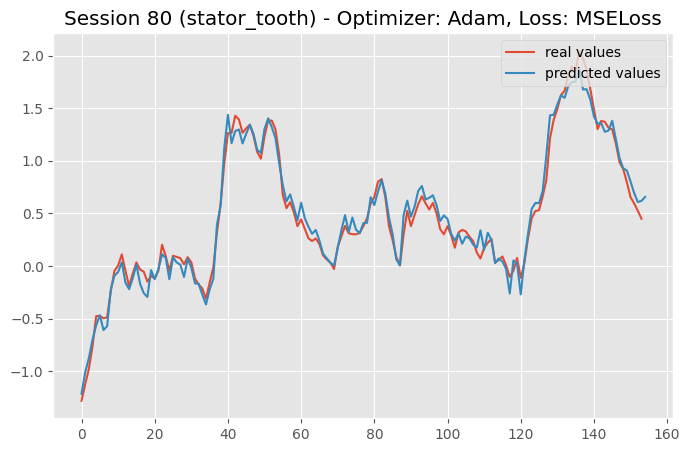

In [430]:
train_and_evaluate_model('stator_tooth', optimizer_adam, criterion) 

In [431]:
class CustomWeightedMSELoss(nn.Module):
    def __init__(self, weight_factor=1.0):
        super(CustomWeightedMSELoss, self).__init__()
        self.weight_factor = weight_factor

    def forward(self, pred, target):
        # Izračunavanje razlike između predviđenih i stvarnih temperatura
        diff = pred - target
        
        # Kvadriranje razlike
        squared_diff = diff**2
        
        # Dodavanje težine razlikama
        weighted_squared_diff = squared_diff * (1 + self.weight_factor * torch.abs(diff))
        
        # Izračunavanje prosečne vrednosti težinskih kvadriranih razlika
        loss = torch.mean(weighted_squared_diff)
        
        return loss

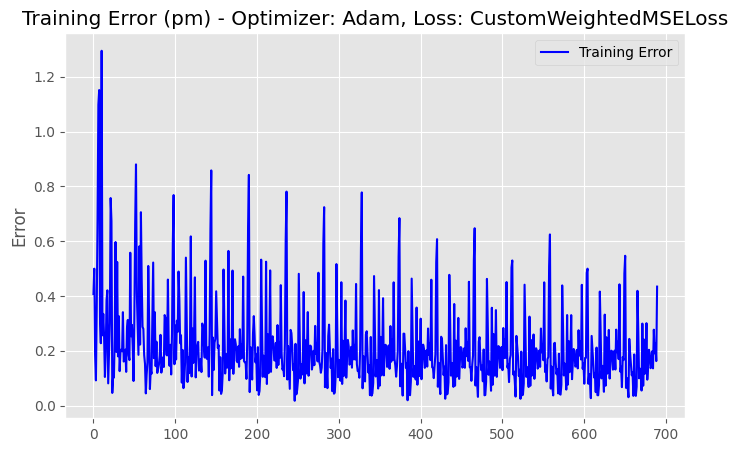

Loss: 0.18183197


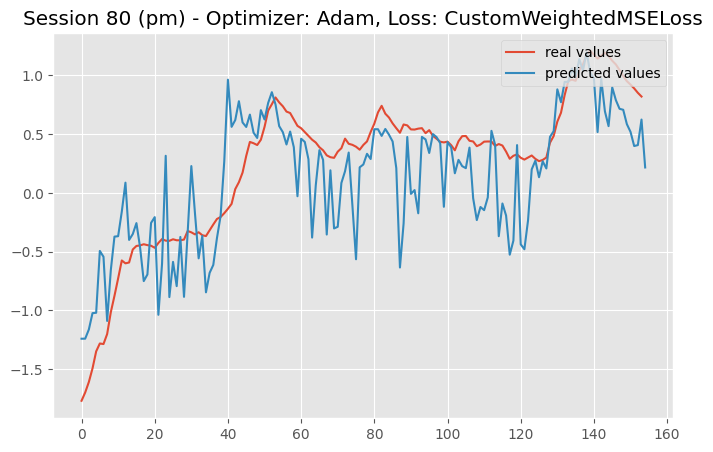

In [432]:
# Definicija custom loss funkcije sa težinskim faktorom
custom_loss = CustomWeightedMSELoss(weight_factor=0.1) 


# Treniranje i evaluacija modela sa custom loss funkcijom
train_and_evaluate_model('pm', optimizer_adam, custom_loss)

## 7. Neural Network Ensemble, Feeding an RNN 

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from keras.layers import Dense, SimpleRNN, Dropout
from tensorflow.keras.utils import plot_model

DataSet = data_df.copy()

In [ ]:
X = DataSet[DataSet['profile_id'] != 20].drop(columns = ['pm','profile_id'])
y = DataSet['pm'][DataSet['profile_id'] != 20]

X_test = DataSet[DataSet['profile_id'] == 20].drop(columns = ['pm','profile_id'])
y_test = DataSet['pm'][DataSet['profile_id'] == 20]

scaler1 = StandardScaler()
scaler2 = StandardScaler()
X = scaler1.fit_transform(X)
y = scaler2.fit_transform(np.asarray(y).reshape(-1, 1))

X_test = scaler1.transform(X_test)
y_test = scaler2.transform(np.asarray(y_test).reshape(-1, 1))

X_train, X_rnn, y_train, y_rnn = train_test_split(X,y, test_size = 0.5,shuffle=False)

In [ ]:
from keras.models import Model
from keras.layers import Input
from keras.layers.merge import concatenate


input_1 = Input(shape=(X.shape[1]))
hlay1_1 = Dense(16,activation = 'relu')(input_1)
hlay2_1 = Dense(16,activation = 'relu')(hlay1_1)
final_dnn1 = Dense(1,activation = 'linear')(hlay2_1)
dnn1 = Model(inputs=input_1, outputs=final_dnn1)
dnn1.compile(optimizer = "adam", loss = "mean_squared_error")

input_2 = Input(shape=(X.shape[1]))
hlay1_2 = Dense(32,activation = 'relu')(input_2)
hlay2_2 = Dense(16,activation = 'relu')(hlay1_2)
final_dnn2 = Dense(1,activation = 'linear')(hlay2_2)
dnn2 = Model(inputs=input_2, outputs=final_dnn2)
dnn2.compile(optimizer = "adam", loss = "mean_absolute_percentage_error")

input_3 = Input(shape=(X.shape[1]))
hlay1_3 = Dense(16,activation = 'sigmoid')(input_3)
hlay2_3 = Dense(16,activation = 'sigmoid')(hlay1_3)
hlay3_3 = Dense(8,activation = 'relu')(hlay2_3)
final_dnn3 = Dense(1,activation = 'linear')(hlay3_3)
dnn3 = Model(inputs=input_3, outputs=final_dnn3)
dnn3.compile(optimizer = "adam", loss = "mean_squared_error")

input_4 = Input(shape=(X.shape[1]))
hlay1_4 = Dense(32,activation = 'relu')(input_4)
hlay2_4 = Dense(32,activation = 'sigmoid')(hlay1_4)
final_dnn4 = Dense(1,activation = 'linear')(hlay2_4)
dnn4 = Model(inputs=input_4, outputs=final_dnn4)
dnn4.compile(optimizer = "adam", loss = "mean_squared_error")

2022-08-26 04:57:16.019238: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


### To further the diversity of the constiuent NNs in the ensemble, we give each network a random sampling from the overall training data. This is a bagging method.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.6)
dnn1.fit(X_train, y_train, epochs = 15, batch_size = 32,verbose=True,validation_data=(X_val, y_val))

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.6)
dnn2.fit(X_train, y_train, epochs = 15, batch_size = 32,verbose=True,validation_data=(X_val, y_val))

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.6)
dnn3.fit(X_train, y_train, epochs = 15, batch_size = 32,verbose=True,validation_data=(X_val, y_val))

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.6)
dnn4.fit(X_train, y_train, epochs = 15, batch_size = 64,verbose=True,validation_data=(X_val, y_val))

2022-08-26 04:57:16.554792: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/15
16086/16086 [==============================] - 43s 3ms/step - loss: 0.1157 - val_loss: 0.0908
Epoch 2/15
16086/16086 [==============================] - 41s 3ms/step - loss: 0.0860 - val_loss: 0.0839
Epoch 3/15
16086/16086 [==============================] - 43s 3ms/step - loss: 0.0797 - val_loss: 0.0776
Epoch 4/15
16086/16086 [==============================] - 42s 3ms/step - loss: 0.0764 - val_loss: 0.0761
Epoch 5/15
16086/16086 [==============================] - 41s 3ms/step - loss: 0.0743 - val_loss: 0.0762
Epoch 6/15
16086/16086 [==============================] - 41s 3ms/step - loss: 0.0728 - val_loss: 0.0777
Epoch 7/15
16086/16086 [==============================] - 40s 2ms/step - loss: 0.0718 - val_loss: 0.0697
Epoch 8/15
16086/16086 [==============================] - 43s 3ms/step - loss: 0.0709 - val_loss: 0.0708
Epoch 9/15
16086/16086 [==============================] - 41s 3ms/step - loss: 0.0701 - val_loss: 0.0690
Epoch 10/15
16086/16086 [==============================

### Now we must construct the combiner network. We will make the constituent networks non-trainable and merge their output, feeding into the hidden layers of our combiner network

In [ ]:
dnn1.trainable = False; dnn2.trainable = False; dnn3.trainable = False; dnn4.trainable = False;

enn_input = Input(shape=(X_train.shape[1]))
const_1 = dnn1(enn_input)
const_2 = dnn2(enn_input)
const_3 = dnn3(enn_input)
const_4 = dnn4(enn_input)
enn_1 = Dense(8,activation = 'relu')(enn_input)
merge = concatenate(inputs = [const_1,const_2,const_3,const_4,enn_1])
enn_2 = Dense(32,activation = 'relu')(merge)
enn_3 = Dense(32,activation = 'relu')(enn_2)
final = Dense(1,activation = 'linear')(enn_3)
enn = Model(inputs=enn_input, outputs=final)
enn.compile(optimizer = "adam", loss = "mean_squared_error")

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.2)

history = enn.fit(X_train, y_train, epochs = 100, batch_size = 32,verbose=True,validation_data=(X_val, y_val))

Epoch 1/100
32172/32172 [==============================] - 100s 3ms/step - loss: 0.0459 - val_loss: 0.0424
Epoch 2/100
32172/32172 [==============================] - 99s 3ms/step - loss: 0.0417 - val_loss: 0.0399
Epoch 3/100
32172/32172 [==============================] - 101s 3ms/step - loss: 0.0401 - val_loss: 0.0389
Epoch 4/100
32172/32172 [==============================] - 101s 3ms/step - loss: 0.0391 - val_loss: 0.0383
Epoch 5/100
32172/32172 [==============================] - 100s 3ms/step - loss: 0.0384 - val_loss: 0.0376
Epoch 6/100
32172/32172 [==============================] - 99s 3ms/step - loss: 0.0379 - val_loss: 0.0370
Epoch 7/100
32172/32172 [==============================] - 100s 3ms/step - loss: 0.0375 - val_loss: 0.0368
Epoch 8/100
32172/32172 [==============================] - 98s 3ms/step - loss: 0.0371 - val_loss: 0.0369
Epoch 9/100
32172/32172 [==============================] - 98s 3ms/step - loss: 0.0369 - val_loss: 0.0374
Epoch 10/100
32172/32172 [===============

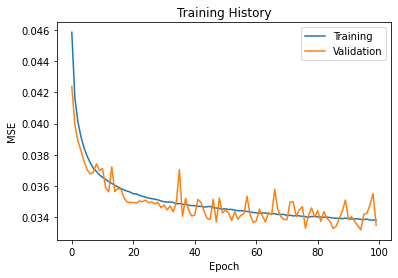

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend(['Training','Validation'])
plt.show()

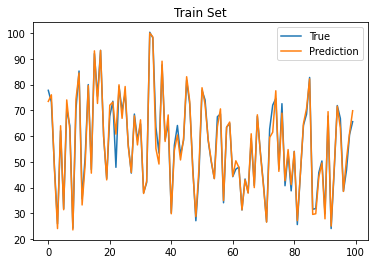

In [ ]:
y_pred = enn.predict(X_train)
plt.plot(scaler2.inverse_transform(y_train[1100:1200]))
plt.plot(scaler2.inverse_transform(y_pred[1100:1200]))
plt.legend(['True','Prediction'])
plt.title('Train Set')
plt.show()

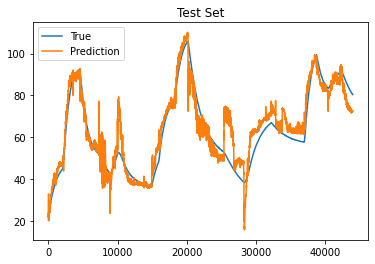

In [ ]:
y_pred_test = enn.predict(X_test)
plt.plot(scaler2.inverse_transform(y_test))
plt.plot(scaler2.inverse_transform(y_pred_test))
plt.legend(['True','Prediction'])
plt.title('Test Set')
plt.show()

### It did okay on the test set, but there were large spikes when there shouldn't have been. In order to do a better job at capturing the trends, I'll going to encorporate an RNN into my model

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_rnn,y_rnn, test_size = 0.2)

X_train_rnn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
y_train_rnn = np.reshape(y_train, (y_train.shape[0],1))
X_val_rnn = np.reshape(X_val, (X_val.shape[0], X_val.shape[1],1))
y_val_rnn = np.reshape(y_val, (y_val.shape[0],1))

enn.trainable = False;

input_rnn = Input(shape=(X_train.shape[1], 1))
input_enn = Input(shape=(X_train.shape[1]))
rnn1 = SimpleRNN(16, return_sequences=True)(input_rnn)
drop1 = Dropout(0.2)(rnn1)
rnn2 = SimpleRNN(16, return_sequences=False)(drop1)
drop2 = Dropout(0.2)(rnn2)
enn_lay = enn(input_enn)
merge = concatenate(inputs = [enn_lay,drop2])
combine1 = Dense(16,activation = 'relu')(merge)
combine2 = Dense(16,activation = 'relu')(combine1)
final = Dense(1)(combine2)

ernn = Model(inputs=[input_rnn,input_enn], outputs=final)
ernn.compile(optimizer = "adam", loss = "mean_squared_error")
plot_model(ernn)
history = ernn.fit([X_train_rnn,X_train], y_train, epochs = 50, batch_size = 32,verbose=True,validation_data=([X_val_rnn,X_val], y_val))


Epoch 1/50
16086/16086 [==============================] - 162s 10ms/step - loss: 0.0487 - val_loss: 0.0454
Epoch 2/50
16086/16086 [==============================] - 169s 11ms/step - loss: 0.0458 - val_loss: 0.0449
Epoch 3/50
16086/16086 [==============================] - 163s 10ms/step - loss: 0.0454 - val_loss: 0.0447
Epoch 4/50
16086/16086 [==============================] - 162s 10ms/step - loss: 0.0451 - val_loss: 0.0443
Epoch 5/50
16086/16086 [==============================] - 167s 10ms/step - loss: 0.0450 - val_loss: 0.0441
Epoch 6/50
16086/16086 [==============================] - 172s 11ms/step - loss: 0.0448 - val_loss: 0.0438
Epoch 7/50
16086/16086 [==============================] - 164s 10ms/step - loss: 0.0447 - val_loss: 0.0450
Epoch 8/50
16086/16086 [==============================] - 165s 10ms/step - loss: 0.0446 - val_loss: 0.0434
Epoch 9/50
16086/16086 [==============================] - 163s 10ms/step - loss: 0.0445 - val_loss: 0.0440
Epoch 10/50
16086/16086 [============

In [ ]:
history = ernn.fit([X_train_rnn,X_train], y_train, epochs = 50, batch_size = 32,verbose=True,validation_data=([X_val_rnn,X_val], y_val))

Epoch 1/50
16086/16086 [==============================] - 162s 10ms/step - loss: 0.0430 - val_loss: 0.0415
Epoch 2/50
16086/16086 [==============================] - 165s 10ms/step - loss: 0.0430 - val_loss: 0.0418
Epoch 3/50
16086/16086 [==============================] - 161s 10ms/step - loss: 0.0430 - val_loss: 0.0411
Epoch 4/50
16086/16086 [==============================] - 169s 10ms/step - loss: 0.0430 - val_loss: 0.0419
Epoch 5/50
16086/16086 [==============================] - 170s 11ms/step - loss: 0.0430 - val_loss: 0.0416
Epoch 6/50
16086/16086 [==============================] - 158s 10ms/step - loss: 0.0429 - val_loss: 0.0411
Epoch 7/50
16086/16086 [==============================] - 166s 10ms/step - loss: 0.0429 - val_loss: 0.0414
Epoch 8/50
16086/16086 [==============================] - 163s 10ms/step - loss: 0.0429 - val_loss: 0.0409
Epoch 9/50
16086/16086 [==============================] - 163s 10ms/step - loss: 0.0429 - val_loss: 0.0411
Epoch 10/50
16086/16086 [============

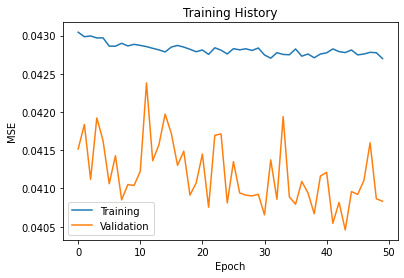

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend(['Training','Validation'])
plt.show()

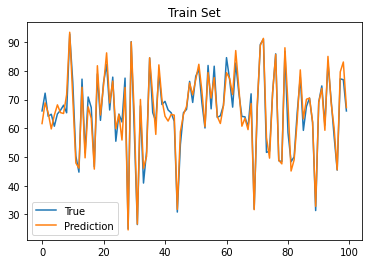

In [ ]:
y_pred = ernn.predict([X_train_rnn,X_train])
plt.plot(scaler2.inverse_transform(y_train[1100:1200]))
plt.plot(scaler2.inverse_transform(y_pred[1100:1200]))
plt.legend(['True','Prediction'])
plt.title('Train Set')
plt.show()

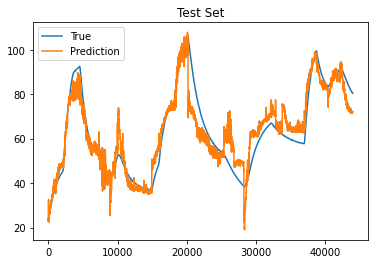

In [ ]:
X_test_rnn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))

y_pred_test = ernn.predict([X_test_rnn,X_test])
plt.plot(scaler2.inverse_transform(y_test))
plt.plot(scaler2.inverse_transform(y_pred_test))
plt.legend(['True','Prediction'])
plt.title('Test Set')
plt.show()

### Overall, there was a marginal improvement when adding the RNN, though it comes at the expense of much longer compute times, it's my best model for prediciting pm